# My name: Bryan Lihardinata
## Assignment Name: CA03 - Decision Tree

# Program Inititialization Section
## Enter your import packages here

In [189]:
# import packages 
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeClassifier

In [190]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## Data File Reading Section
### Write code to read in data from external sources here
##### The dataset is obtained from the Census Bureau and represents salaries of people along with seven demographic variables. The following is a description of our dataset:
- Number of target classes: 2 ('>50K' and '<=50K') [ Labels: 1, 0 ]
- Number of attributes (Columns): 7
- Number of instances (Rows): 48,842

In [191]:
#read datasets
df = pd.read_csv('/content/drive/MyDrive/MSBA_Colab_2020/ML_Algorithms/CA03/census_data.csv')
df

,hours_per_week_bin,occupation_bin,msr_bin,capital_gl_bin,race_sex_bin,education_num_bin,education_bin,workclass_bin,age_bin,flag,y
0,b. 31-40,b. Mid - Low,b. Mid,c. > 0,c. High,c. 13,c. Bachelors,b. income,d. 36-40 & 56-60,train,0
1,a. 0-30,e. High,c. High,a. = 0,c. High,c. 13,c. Bachelors,b. income,e. 40-55,train,0
2,b. 31-40,a. Low,b. Mid,a. = 0,c. High,b. 9-12,b. Mid,b. income,d. 36-40 & 56-60,train,0
3,b. 31-40,a. Low,c. High,a. = 0,b. Mid,a. 0-8,a. Low,b. income,e. 40-55,train,0
4,b. 31-40,e. High,c. High,a. = 0,a. Low,c. 13,c. Bachelors,b. income,b. 26-30 & 71-100,train,0
...,...,...,...,...,...,...,...,...,...,...,...
48837,b. 31-40,e. High,b. Mid,a. = 0,b. Mid,c. 13,c. Bachelors,b. income,d. 36-40 & 56-60,test,0
48838,b. 31-40,b. Mid - Low,a. Low,a. = 0,b. Mid,b. 9-12,b. Mid,a. no income,c. 31-35 & 61-70,test,0
48839,d. 41-50 & 61-70,e. High,c. High,a. = 0,c. High,c. 13,c. Bachelors,b. income,d. 36-40 & 56-60,test,0
48840,b. 31-40,b. Mid - Low,a. Low,c. > 0,c. High,c. 13,c. Bachelors,b. income,e. 40-55,test,0


# Initial Data Investigation Section

## Summarized details
### Generate descriptive statistics that summarize the central tendency, dispersion, and shape of a dataset’s distribution, excluding NaN values.




In [192]:
#Statistical Description of data (data.describe)
df.describe()
#result nothing because the data has been discretized

,y
count,48842.000000
mean,0.239282
std,0.426649
min,0.000000
25%,0.000000
50%,0.000000
75%,0.000000
max,1.000000


In [193]:
#Statistical Description of data (data.shape)
df.shape

(48842, 11)

In [194]:
#Display number of non-null values for each column (data.count)
df.count()
#no null value

hours_per_week_bin    48842
occupation_bin        48842
msr_bin               48842
capital_gl_bin        48842
race_sex_bin          48842
education_num_bin     48842
education_bin         48842
workclass_bin         48842
age_bin               48842
flag                  48842
y                     48842
dtype: int64

In [195]:
#double Checking null value
df[df.isnull().any(axis=1)].count()

hours_per_week_bin    0
occupation_bin        0
msr_bin               0
capital_gl_bin        0
race_sex_bin          0
education_num_bin     0
education_bin         0
workclass_bin         0
age_bin               0
flag                  0
y                     0
dtype: int64

In [196]:
#Display range, column, number of non-null objects of each column, datatype and memory usage (data.info)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48842 entries, 0 to 48841
Data columns (total 11 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   hours_per_week_bin  48842 non-null  object
 1   occupation_bin      48842 non-null  object
 2   msr_bin             48842 non-null  object
 3   capital_gl_bin      48842 non-null  object
 4   race_sex_bin        48842 non-null  object
 5   education_num_bin   48842 non-null  object
 6   education_bin       48842 non-null  object
 7   workclass_bin       48842 non-null  object
 8   age_bin             48842 non-null  object
 9   flag                48842 non-null  object
 10  y                   48842 non-null  int64 
dtypes: int64(1), object(10)
memory usage: 4.1+ MB


In [197]:
#Display Top 10 and Bottom 10 records (head and tail)
df.head(10)

,hours_per_week_bin,occupation_bin,msr_bin,capital_gl_bin,race_sex_bin,education_num_bin,education_bin,workclass_bin,age_bin,flag,y
0,b. 31-40,b. Mid - Low,b. Mid,c. > 0,c. High,c. 13,c. Bachelors,b. income,d. 36-40 & 56-60,train,0
1,a. 0-30,e. High,c. High,a. = 0,c. High,c. 13,c. Bachelors,b. income,e. 40-55,train,0
2,b. 31-40,a. Low,b. Mid,a. = 0,c. High,b. 9-12,b. Mid,b. income,d. 36-40 & 56-60,train,0
3,b. 31-40,a. Low,c. High,a. = 0,b. Mid,a. 0-8,a. Low,b. income,e. 40-55,train,0
4,b. 31-40,e. High,c. High,a. = 0,a. Low,c. 13,c. Bachelors,b. income,b. 26-30 & 71-100,train,0
5,b. 31-40,e. High,c. High,a. = 0,b. Mid,d. 14,d. Masters,b. income,d. 36-40 & 56-60,train,0
6,a. 0-30,a. Low,b. Mid,a. = 0,a. Low,a. 0-8,a. Low,b. income,e. 40-55,train,0
7,d. 41-50 & 61-70,e. High,c. High,a. = 0,c. High,b. 9-12,b. Mid,b. income,e. 40-55,train,1
8,d. 41-50 & 61-70,e. High,b. Mid,c. > 0,b. Mid,d. 14,d. Masters,b. income,c. 31-35 & 61-70,train,1
9,b. 31-40,e. High,c. High,c. > 0,c. High,c. 13,c. Bachelors,b. income,e. 40-55,train,1


In [198]:
df.tail(10)

,hours_per_week_bin,occupation_bin,msr_bin,capital_gl_bin,race_sex_bin,education_num_bin,education_bin,workclass_bin,age_bin,flag,y
48832,d. 41-50 & 61-70,c. Mid - Mid,c. High,a. = 0,c. High,b. 9-12,b. Mid,b. income,c. 31-35 & 61-70,test,0
48833,b. 31-40,c. Mid - Mid,c. High,a. = 0,c. High,b. 9-12,b. Mid,b. income,c. 31-35 & 61-70,test,0
48834,b. 31-40,a. Low,a. Low,a. = 0,b. Mid,b. 9-12,b. Mid,b. income,a. 0-25,test,0
48835,b. 31-40,a. Low,b. Mid,a. = 0,c. High,d. 14,d. Masters,b. income,e. 40-55,test,0
48836,b. 31-40,e. High,a. Low,a. = 0,c. High,c. 13,c. Bachelors,b. income,c. 31-35 & 61-70,test,0
48837,b. 31-40,e. High,b. Mid,a. = 0,b. Mid,c. 13,c. Bachelors,b. income,d. 36-40 & 56-60,test,0
48838,b. 31-40,b. Mid - Low,a. Low,a. = 0,b. Mid,b. 9-12,b. Mid,a. no income,c. 31-35 & 61-70,test,0
48839,d. 41-50 & 61-70,e. High,c. High,a. = 0,c. High,c. 13,c. Bachelors,b. income,d. 36-40 & 56-60,test,0
48840,b. 31-40,b. Mid - Low,a. Low,c. > 0,c. High,c. 13,c. Bachelors,b. income,e. 40-55,test,0
48841,e. 51-60,e. High,c. High,a. = 0,c. High,c. 13,c. Bachelors,b. income,c. 31-35 & 61-70,test,1


## Beautifying the dataset
- Changing the "Y" column into "Target" 
- Removing "bins" from variable names




In [199]:
#Rename the columns for a better clarification
df.rename(columns= {'hours_per_week_bin':'hours_per_week', 
                    'occupation_bin':'occupation',
                    'msr_bin': 'marital_status',
                    'capital_gl_bin':'capital_gain_loss',
                    'education_num_bin':'education_num',
                    'education_bin':'education',
                    'race_sex_bin':'race_sex',
                    'workclass_bin':'workclass',
                    'age_bin':'age',
                    'y': 'target'}, inplace= True)
df

,hours_per_week,occupation,marital_status,capital_gain_loss,race_sex,education_num,education,workclass,age,flag,target
0,b. 31-40,b. Mid - Low,b. Mid,c. > 0,c. High,c. 13,c. Bachelors,b. income,d. 36-40 & 56-60,train,0
1,a. 0-30,e. High,c. High,a. = 0,c. High,c. 13,c. Bachelors,b. income,e. 40-55,train,0
2,b. 31-40,a. Low,b. Mid,a. = 0,c. High,b. 9-12,b. Mid,b. income,d. 36-40 & 56-60,train,0
3,b. 31-40,a. Low,c. High,a. = 0,b. Mid,a. 0-8,a. Low,b. income,e. 40-55,train,0
4,b. 31-40,e. High,c. High,a. = 0,a. Low,c. 13,c. Bachelors,b. income,b. 26-30 & 71-100,train,0
...,...,...,...,...,...,...,...,...,...,...,...
48837,b. 31-40,e. High,b. Mid,a. = 0,b. Mid,c. 13,c. Bachelors,b. income,d. 36-40 & 56-60,test,0
48838,b. 31-40,b. Mid - Low,a. Low,a. = 0,b. Mid,b. 9-12,b. Mid,a. no income,c. 31-35 & 61-70,test,0
48839,d. 41-50 & 61-70,e. High,c. High,a. = 0,c. High,c. 13,c. Bachelors,b. income,d. 36-40 & 56-60,test,0
48840,b. 31-40,b. Mid - Low,a. Low,c. > 0,c. High,c. 13,c. Bachelors,b. income,e. 40-55,test,0


## Display graphical representations of the income group Vs each of seven explanatory variables
#### Income group refers to target: 
income lower than or equal to 50k is labelled as "0" & income higher than 50k refers is labelled as "1"

1. Age 
2. Capital Gain/Loss 
3. Education
4. Hours per week
5. Marriage Status 
6. Occupation
7. Race and Sex





1. Age VS Income Target

In [200]:
#Display age vs target
#aggfunc = len is the same as count() in excel
age_summary = df.loc[:, ["age", "target"]]
age_summary = age_summary.pivot_table(values= "target", columns= "target", index= "age", aggfunc=len)
age_summary

target,0,1
age,,
a. 0-25,9458,169
b. 26-30 & 71-100,6059,975
c. 31-35 & 61-70,7036,2255
d. 36-40 & 56-60,5972,2955
e. 40-55,8630,5333


In [201]:
#change the age into a ratio
#Axis = 1 -> sum across the rows
age_summary[0] = age_summary[0]/age_summary.sum(axis=1)
age_summary[1] = 1-age_summary[0]
age_summary

target,0,1
age,,
a. 0-25,0.982445,0.017555
b. 26-30 & 71-100,0.861388,0.138612
c. 31-35 & 61-70,0.757292,0.242708
d. 36-40 & 56-60,0.668982,0.331018
e. 40-55,0.618062,0.381938


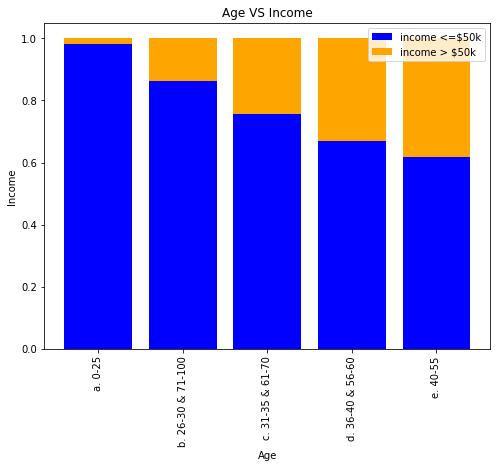

In [202]:
#Displaying a graph for Age VS Income
plt.figure(figsize=(8,6))
plt.bar(age_summary.index, age_summary[0], color = 'blue', label = 'income <=$50k')
plt.bar(age_summary.index, age_summary[1], bottom = age_summary[0], color = 'orange', label = 'income > $50k')
plt.title('Age VS Income')
plt.xlabel('Age')
plt.ylabel('Income')
plt.xticks(rotation = 90)
plt.legend()
plt.show()

2. Capital Gain/Loss VS Income Target

In [203]:
#Capital gain vs capital lost
#aggfunc = len is the same as count() in excel
capital_summary = df.loc[:, ["capital_gain_loss", "target"]]
capital_summary = capital_summary.pivot_table(values= "target", columns= "target", index= "capital_gain_loss", aggfunc=len)
capital_summary

target,0,1
capital_gain_loss,,
a. = 0,34473,8052
b. < 0,1138,1144
c. > 0,1544,2491


In [204]:
#change the age into a ratio
capital_summary[0] = capital_summary[0]/capital_summary.sum(axis=1)
capital_summary[1] = 1-capital_summary[0]
capital_summary

target,0,1
capital_gain_loss,,
a. = 0,0.810653,0.189347
b. < 0,0.498685,0.501315
c. > 0,0.382652,0.617348


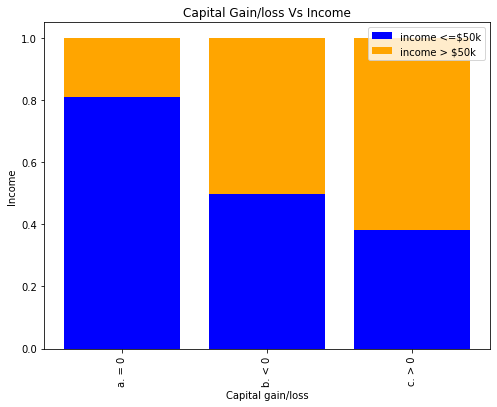

In [205]:
#Displaying a graph for Capital gain Vs Income
plt.figure(figsize=(8,6))
plt.bar(capital_summary.index, capital_summary[0], color = 'blue', label = 'income <=$50k')
plt.bar(capital_summary.index, capital_summary[1], bottom = capital_summary[0], color = 'orange', label = 'income > $50k')
plt.title('Capital Gain/loss Vs Income')
plt.xlabel('Capital gain/loss')
plt.ylabel('Income')
plt.xticks(rotation = 90)
plt.legend()
plt.show()

3. Education VS Income Target

In [206]:
#Education
#aggfunc = len is the same as count() in excel
education_summary = df.loc[:, ["education", "target"]]
education_summary = education_summary.pivot_table(values= "target", columns= "target", index= "education", aggfunc=len)
education_summary

target,0,1
education,,
a. Low,6042,366
b. Mid,24823,5501
c. Bachelors,4712,3313
d. Masters,1198,1459
e. High,380,1048


In [207]:
#change the education into a ratio
education_summary[0] = education_summary[0]/education_summary.sum(axis=1)
education_summary[1] = 1-education_summary[0]
education_summary

target,0,1
education,,
a. Low,0.942884,0.057116
b. Mid,0.818593,0.181407
c. Bachelors,0.587165,0.412835
d. Masters,0.450884,0.549116
e. High,0.266106,0.733894


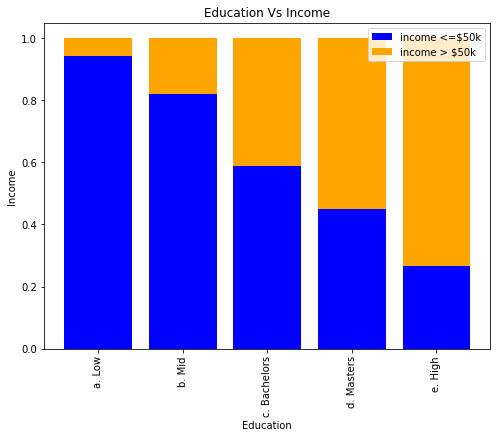

In [208]:
#Displaying a graph for Education Vs Income
plt.figure(figsize=(8,6))
plt.bar(education_summary.index, education_summary[0], color = 'blue', label = 'income <=$50k')
plt.bar(education_summary.index, education_summary[1], bottom = education_summary[0], color = 'orange', label = 'income > $50k')
plt.title('Education Vs Income')
plt.xlabel('Education')
plt.ylabel('Income')
plt.xticks(rotation = 90)
plt.legend()
plt.show()

4. Hours Per Week VS Income

In [209]:
#Display hours per week vs income
#aggfunc = len is the same as count() in excel
hours_summary = df.loc[:, ["hours_per_week", "target"]]
hours_summary = hours_summary.pivot_table(values= "target", columns= "target", index= "hours_per_week", aggfunc=len)
hours_summary

target,0,1
hours_per_week,,
a. 0-30,7325,526
b. 31-40,21220,5419
c. 71-100,507,267
d. 41-50 & 61-70,5968,3851
e. 51-60,2135,1624


In [210]:
#change hours/week into a ratio
hours_summary[0] = hours_summary[0]/hours_summary.sum(axis=1)
hours_summary[1] = 1-hours_summary[0]
hours_summary

target,0,1
hours_per_week,,
a. 0-30,0.933002,0.066998
b. 31-40,0.796576,0.203424
c. 71-100,0.655039,0.344961
d. 41-50 & 61-70,0.607801,0.392199
e. 51-60,0.567970,0.432030


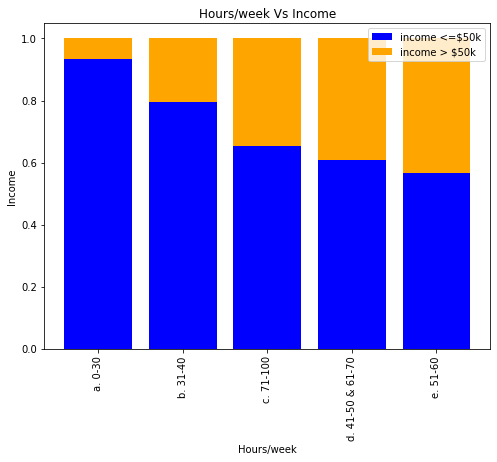

In [211]:
#Displaying a graph for Hours/Week Vs Income
plt.figure(figsize=(8,6))
plt.bar(hours_summary.index, hours_summary[0], color = 'blue', label = 'income <=$50k')
plt.bar(hours_summary.index, hours_summary[1], bottom = hours_summary[0], color = 'orange', label = 'income > $50k')
plt.title('Hours/week Vs Income')
plt.xlabel('Hours/week')
plt.ylabel('Income')
plt.xticks(rotation = 90)
plt.legend()
plt.show()

5. Marriage Status & Relationship VS Income Target

In [212]:
#Marital Status
#aggfunc = len is the same as count() in excel
marital_status_summary = df.loc[:, ["marital_status", "target"]]
marital_status_summary = marital_status_summary.pivot_table(values= "target", columns= "target", index= "marital_status", aggfunc=len)
marital_status_summary

target,0,1
marital_status,,
a. Low,10751,176
b. Mid,14296,1572
c. High,12108,9939


In [213]:
#change hours/week into a ratio
marital_status_summary[0] = marital_status_summary[0]/marital_status_summary.sum(axis=1)
marital_status_summary[1] = 1-marital_status_summary[0]
marital_status_summary

target,0,1
marital_status,,
a. Low,0.983893,0.016107
b. Mid,0.900933,0.099067
c. High,0.549190,0.450810


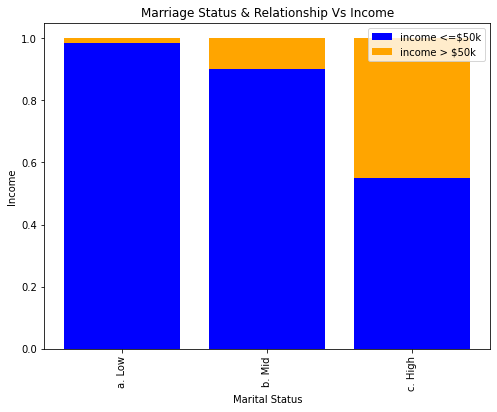

In [214]:
#Displaying marital status Vs Income
plt.figure(figsize=(8,6))
plt.bar(marital_status_summary.index, marital_status_summary[0], color = 'blue', label = 'income <=$50k')
plt.bar(marital_status_summary.index, marital_status_summary[1], bottom = marital_status_summary[0], color = 'orange', label = 'income > $50k')
plt.title('Marriage Status & Relationship Vs Income')
plt.xlabel('Marital Status')
plt.ylabel('Income')
plt.xticks(rotation = 90)
plt.legend()
plt.show()

6. Occupation VS Income Target

In [215]:
#Occupation
#aggfunc = len is the same as count() in excel
occupation_summary = df.loc[:, ["occupation", "target"]]
occupation_summary = occupation_summary.pivot_table(values= "target", columns= "target", index= "occupation", aggfunc=len)
occupation_summary

target,0,1
occupation,,
a. Low,6892,345
b. Mid - Low,11364,1583
c. Mid - Mid,10632,3339
d. Mid - High,1701,728
e. High,6566,5692


In [216]:
#Change occupation into a ratio
occupation_summary[0] = occupation_summary[0]/occupation_summary.sum(axis=1)
occupation_summary[1] = 1-occupation_summary[0]
occupation_summary

target,0,1
occupation,,
a. Low,0.952328,0.047672
b. Mid - Low,0.877732,0.122268
c. Mid - Mid,0.761005,0.238995
d. Mid - High,0.700288,0.299712
e. High,0.535650,0.464350


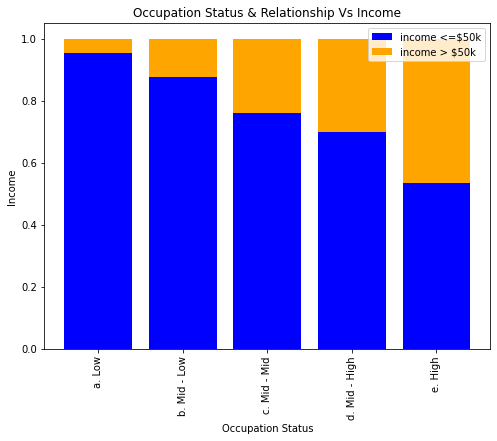

In [217]:
#Displaying Occupation Vs Income
plt.figure(figsize=(8,6))
plt.bar(occupation_summary.index, occupation_summary[0], color = 'blue', label = 'income <=$50k')
plt.bar(occupation_summary.index, occupation_summary[1], bottom = occupation_summary[0], color = 'orange', label = 'income > $50k')
plt.title('Occupation Status & Relationship Vs Income')
plt.xlabel('Occupation Status')
plt.ylabel('Income')
plt.xticks(rotation = 90)
plt.legend()
plt.show()

7. Race & Sex vs Income Target

In [218]:
#Race & Sex
#aggfunc = len is the same as count() in excel
race_sex_summary = df.loc[:, ["race_sex", "target"]]
race_sex_summary = race_sex_summary.pivot_table(values= "target", columns= "target", index= "race_sex", aggfunc=len)
race_sex_summary

target,0,1
race_sex,,
a. Low,2490,158
b. Mid,14333,2124
c. High,20332,9405


In [219]:
#Change the race and sex into ratio (with a different method for educational purposes)
race_sex_summary = race_sex_summary.apply(lambda x: x/sum(x), axis=1)
race_sex_summary

target,0,1
race_sex,,
a. Low,0.940332,0.059668
b. Mid,0.870936,0.129064
c. High,0.683727,0.316273


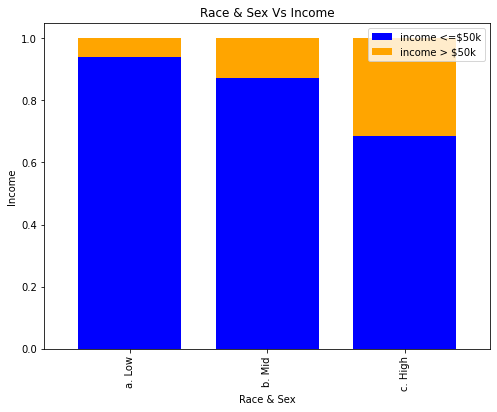

In [220]:
#Stacked bar chart in a different method for learning purposes
#ax = single object in the figure/graph
fig, ax = plt.subplots()
race_sex_summary.plot(kind = "bar", stacked = True, figsize = (8,6), ax = ax, color = ['blue', 'orange'], width = 0.75)
ax.legend(['income <=$50k', 'income > $50k'])
plt.title('Race & Sex Vs Income')
plt.xlabel('Race & Sex')
plt.ylabel('Income')
plt.show()

# Build Decision Tree Classifier Models

## Splitting the dataframe into train and test based on "flag"

In [221]:
#Split the dataset into train
train = df[df.flag == "train"]
train

,hours_per_week,occupation,marital_status,capital_gain_loss,race_sex,education_num,education,workclass,age,flag,target
0,b. 31-40,b. Mid - Low,b. Mid,c. > 0,c. High,c. 13,c. Bachelors,b. income,d. 36-40 & 56-60,train,0
1,a. 0-30,e. High,c. High,a. = 0,c. High,c. 13,c. Bachelors,b. income,e. 40-55,train,0
2,b. 31-40,a. Low,b. Mid,a. = 0,c. High,b. 9-12,b. Mid,b. income,d. 36-40 & 56-60,train,0
3,b. 31-40,a. Low,c. High,a. = 0,b. Mid,a. 0-8,a. Low,b. income,e. 40-55,train,0
4,b. 31-40,e. High,c. High,a. = 0,a. Low,c. 13,c. Bachelors,b. income,b. 26-30 & 71-100,train,0
...,...,...,...,...,...,...,...,...,...,...,...
32556,b. 31-40,d. Mid - High,c. High,a. = 0,b. Mid,b. 9-12,b. Mid,b. income,b. 26-30 & 71-100,train,0
32557,b. 31-40,b. Mid - Low,c. High,a. = 0,c. High,b. 9-12,b. Mid,b. income,d. 36-40 & 56-60,train,1
32558,b. 31-40,b. Mid - Low,b. Mid,a. = 0,b. Mid,b. 9-12,b. Mid,b. income,d. 36-40 & 56-60,train,0
32559,a. 0-30,b. Mid - Low,a. Low,a. = 0,c. High,b. 9-12,b. Mid,b. income,a. 0-25,train,0


In [222]:
#Split the dataset into test
#reset_index is used so that index starts at 0
#drop = false is the default -> keeping the original index as a column
test = df[df.flag == "test"].reset_index(drop=True)
test

,hours_per_week,occupation,marital_status,capital_gain_loss,race_sex,education_num,education,workclass,age,flag,target
0,b. 31-40,b. Mid - Low,a. Low,a. = 0,b. Mid,a. 0-8,a. Low,b. income,a. 0-25,test,0
1,d. 41-50 & 61-70,b. Mid - Low,c. High,a. = 0,c. High,b. 9-12,b. Mid,b. income,d. 36-40 & 56-60,test,0
2,b. 31-40,d. Mid - High,c. High,a. = 0,c. High,b. 9-12,b. Mid,b. income,b. 26-30 & 71-100,test,1
3,b. 31-40,b. Mid - Low,c. High,c. > 0,b. Mid,b. 9-12,b. Mid,b. income,e. 40-55,test,1
4,a. 0-30,b. Mid - Low,a. Low,a. = 0,b. Mid,b. 9-12,b. Mid,a. no income,a. 0-25,test,0
...,...,...,...,...,...,...,...,...,...,...,...
16276,b. 31-40,e. High,b. Mid,a. = 0,b. Mid,c. 13,c. Bachelors,b. income,d. 36-40 & 56-60,test,0
16277,b. 31-40,b. Mid - Low,a. Low,a. = 0,b. Mid,b. 9-12,b. Mid,a. no income,c. 31-35 & 61-70,test,0
16278,d. 41-50 & 61-70,e. High,c. High,a. = 0,c. High,c. 13,c. Bachelors,b. income,d. 36-40 & 56-60,test,0
16279,b. 31-40,b. Mid - Low,a. Low,c. > 0,c. High,c. 13,c. Bachelors,b. income,e. 40-55,test,0


## Building the Decision Tree

### Building The Training Data

In [223]:
#Invoking decision tree classifier
from sklearn.tree import DecisionTreeClassifier

an array X, sparse or dense, of shape (n_samples, n_features) holding the training samples, and an array Y of integer values, shape (n_samples,)

In [224]:
#concept refers to https://www.youtube.com/watch?v=PHxYNGo8NcI&t=601s
from sklearn import tree
X_train = train.drop('target', axis = 'columns')
Y_train = train['target']

In [225]:
#since values are discrete, we should change that into a label
from sklearn.preprocessing import LabelEncoder

In [226]:
#label encoding
le_hours = LabelEncoder()
le_occupation = LabelEncoder()
le_marital = LabelEncoder()
le_capital = LabelEncoder()
le_race_sex = LabelEncoder()
le_education_num = LabelEncoder()
le_education = LabelEncoder()
le_workclass = LabelEncoder()
le_age = LabelEncoder()
le_flag = LabelEncoder()

In [227]:
#adding label code for each column variable to X
X_train['hours_n'] = le_hours.fit_transform(X_train['hours_per_week'])
X_train['occupation_n'] = le_occupation.fit_transform(X_train['occupation'])
X_train['marital_n'] = le_marital.fit_transform(X_train['marital_status'])
X_train['capital_n'] = le_capital.fit_transform(X_train['capital_gain_loss'])
X_train['race_sex_n'] = le_race_sex.fit_transform(X_train['race_sex'])
X_train['education_num_n'] = le_education_num.fit_transform(X_train['education_num'])
X_train['education_n'] = le_education.fit_transform(X_train['education'])
X_train['workclass_n'] = le_workclass.fit_transform(X_train['workclass'])
X_train['age_n'] = le_age.fit_transform(X_train['age'])
X_train.head(10)

,hours_per_week,occupation,marital_status,capital_gain_loss,race_sex,education_num,education,workclass,age,flag,hours_n,occupation_n,marital_n,capital_n,race_sex_n,education_num_n,education_n,workclass_n,age_n
0,b. 31-40,b. Mid - Low,b. Mid,c. > 0,c. High,c. 13,c. Bachelors,b. income,d. 36-40 & 56-60,train,1,1,1,2,2,2,2,1,3
1,a. 0-30,e. High,c. High,a. = 0,c. High,c. 13,c. Bachelors,b. income,e. 40-55,train,0,4,2,0,2,2,2,1,4
2,b. 31-40,a. Low,b. Mid,a. = 0,c. High,b. 9-12,b. Mid,b. income,d. 36-40 & 56-60,train,1,0,1,0,2,1,1,1,3
3,b. 31-40,a. Low,c. High,a. = 0,b. Mid,a. 0-8,a. Low,b. income,e. 40-55,train,1,0,2,0,1,0,0,1,4
4,b. 31-40,e. High,c. High,a. = 0,a. Low,c. 13,c. Bachelors,b. income,b. 26-30 & 71-100,train,1,4,2,0,0,2,2,1,1
5,b. 31-40,e. High,c. High,a. = 0,b. Mid,d. 14,d. Masters,b. income,d. 36-40 & 56-60,train,1,4,2,0,1,3,3,1,3
6,a. 0-30,a. Low,b. Mid,a. = 0,a. Low,a. 0-8,a. Low,b. income,e. 40-55,train,0,0,1,0,0,0,0,1,4
7,d. 41-50 & 61-70,e. High,c. High,a. = 0,c. High,b. 9-12,b. Mid,b. income,e. 40-55,train,3,4,2,0,2,1,1,1,4
8,d. 41-50 & 61-70,e. High,b. Mid,c. > 0,b. Mid,d. 14,d. Masters,b. income,c. 31-35 & 61-70,train,3,4,1,2,1,3,3,1,2
9,b. 31-40,e. High,c. High,c. > 0,c. High,c. 13,c. Bachelors,b. income,e. 40-55,train,1,4,2,2,2,2,2,1,4


In [228]:
#eliminating all non-label columns
X_train_n = X_train.drop(X_train.iloc[:, 0:10].columns, axis= 1)
X_train_n

,hours_n,occupation_n,marital_n,capital_n,race_sex_n,education_num_n,education_n,workclass_n,age_n
0,1,1,1,2,2,2,2,1,3
1,0,4,2,0,2,2,2,1,4
2,1,0,1,0,2,1,1,1,3
3,1,0,2,0,1,0,0,1,4
4,1,4,2,0,0,2,2,1,1
...,...,...,...,...,...,...,...,...,...
32556,1,3,2,0,1,1,1,1,1
32557,1,1,2,0,2,1,1,1,3
32558,1,1,1,0,1,1,1,1,3
32559,0,1,0,0,2,1,1,1,0


In [229]:
#random state = ensures that if you run the program multiple times, it will generate the same randomness.
dtree = DecisionTreeClassifier(max_depth=10, random_state=101, max_features= None, min_samples_leaf=15)
dtree.fit(X_train_n, Y_train)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=10, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=15, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=101, splitter='best')

In [230]:
model = tree.DecisionTreeClassifier()
model = model.fit(X_train_n, Y_train)
print(model)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=None, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')


In [231]:
import time
start_time = time.time()
model = tree.DecisionTreeClassifier()
model = model.fit(X_train_n, Y_train)
print("--- %s seconds ---" % (time.time() - start_time))

--- 0.04718518257141113 seconds ---


In [232]:
#predict example on the first column
model.predict([[1, 1, 1, 2, 2, 2, 2, 1, 3]]) 

array([0])

In [233]:
#prediciting the result for y_test
x_train_pred = dtree.predict(X_train_n)
print(x_train_pred)

[1 0 0 ... 0 0 1]


### Buidling the Test Data

In [234]:
#setting up the column
X_test = test.drop('target', axis = 'columns')
Y_test = test['target']
X_test.head(10)

,hours_per_week,occupation,marital_status,capital_gain_loss,race_sex,education_num,education,workclass,age,flag
0,b. 31-40,b. Mid - Low,a. Low,a. = 0,b. Mid,a. 0-8,a. Low,b. income,a. 0-25,test
1,d. 41-50 & 61-70,b. Mid - Low,c. High,a. = 0,c. High,b. 9-12,b. Mid,b. income,d. 36-40 & 56-60,test
2,b. 31-40,d. Mid - High,c. High,a. = 0,c. High,b. 9-12,b. Mid,b. income,b. 26-30 & 71-100,test
3,b. 31-40,b. Mid - Low,c. High,c. > 0,b. Mid,b. 9-12,b. Mid,b. income,e. 40-55,test
4,a. 0-30,b. Mid - Low,a. Low,a. = 0,b. Mid,b. 9-12,b. Mid,a. no income,a. 0-25,test
5,a. 0-30,a. Low,b. Mid,a. = 0,c. High,a. 0-8,a. Low,b. income,c. 31-35 & 61-70,test
6,b. 31-40,b. Mid - Low,a. Low,a. = 0,b. Mid,b. 9-12,b. Mid,a. no income,b. 26-30 & 71-100,test
7,b. 31-40,e. High,c. High,c. > 0,c. High,e. 15+,e. High,b. income,c. 31-35 & 61-70,test
8,b. 31-40,a. Low,a. Low,a. = 0,b. Mid,b. 9-12,b. Mid,b. income,a. 0-25,test
9,a. 0-30,c. Mid - Mid,c. High,a. = 0,c. High,a. 0-8,a. Low,b. income,e. 40-55,test


In [235]:
#since values are discrete, we should change that into a label
from sklearn.preprocessing import LabelEncoder

#label encoding
le_hours = LabelEncoder()
le_occupation = LabelEncoder()
le_marital = LabelEncoder()
le_capital = LabelEncoder()
le_race_sex = LabelEncoder()
le_education_num = LabelEncoder()
le_education = LabelEncoder()
le_workclass = LabelEncoder()
le_age = LabelEncoder()
le_flag = LabelEncoder()

In [236]:
#adding label code for each column variable to X
X_test['hours_n'] = le_hours.fit_transform(X_test['hours_per_week'])
X_test['occupation_n'] = le_occupation.fit_transform(X_test['occupation'])
X_test['marital_n'] = le_marital.fit_transform(X_test['marital_status'])
X_test['capital_n'] = le_capital.fit_transform(X_test['capital_gain_loss'])
X_test['race_sex_n'] = le_race_sex.fit_transform(X_test['race_sex'])
X_test['education_num_n'] = le_education_num.fit_transform(X_test['education_num'])
X_test['education_n'] = le_education.fit_transform(X_test['education'])
X_test['workclass_n'] = le_workclass.fit_transform(X_test['workclass'])
X_test['age_n'] = le_age.fit_transform(X_test['age'])
X_test.head(10)

,hours_per_week,occupation,marital_status,capital_gain_loss,race_sex,education_num,education,workclass,age,flag,hours_n,occupation_n,marital_n,capital_n,race_sex_n,education_num_n,education_n,workclass_n,age_n
0,b. 31-40,b. Mid - Low,a. Low,a. = 0,b. Mid,a. 0-8,a. Low,b. income,a. 0-25,test,1,1,0,0,1,0,0,1,0
1,d. 41-50 & 61-70,b. Mid - Low,c. High,a. = 0,c. High,b. 9-12,b. Mid,b. income,d. 36-40 & 56-60,test,3,1,2,0,2,1,1,1,3
2,b. 31-40,d. Mid - High,c. High,a. = 0,c. High,b. 9-12,b. Mid,b. income,b. 26-30 & 71-100,test,1,3,2,0,2,1,1,1,1
3,b. 31-40,b. Mid - Low,c. High,c. > 0,b. Mid,b. 9-12,b. Mid,b. income,e. 40-55,test,1,1,2,2,1,1,1,1,4
4,a. 0-30,b. Mid - Low,a. Low,a. = 0,b. Mid,b. 9-12,b. Mid,a. no income,a. 0-25,test,0,1,0,0,1,1,1,0,0
5,a. 0-30,a. Low,b. Mid,a. = 0,c. High,a. 0-8,a. Low,b. income,c. 31-35 & 61-70,test,0,0,1,0,2,0,0,1,2
6,b. 31-40,b. Mid - Low,a. Low,a. = 0,b. Mid,b. 9-12,b. Mid,a. no income,b. 26-30 & 71-100,test,1,1,0,0,1,1,1,0,1
7,b. 31-40,e. High,c. High,c. > 0,c. High,e. 15+,e. High,b. income,c. 31-35 & 61-70,test,1,4,2,2,2,4,4,1,2
8,b. 31-40,a. Low,a. Low,a. = 0,b. Mid,b. 9-12,b. Mid,b. income,a. 0-25,test,1,0,0,0,1,1,1,1,0
9,a. 0-30,c. Mid - Mid,c. High,a. = 0,c. High,a. 0-8,a. Low,b. income,e. 40-55,test,0,2,2,0,2,0,0,1,4


In [237]:
#eliminating all non-label columns
X_test_n = X_test.drop(X_test.iloc[:, 0:10].columns, axis= 1)
X_test_n.head(10)

,hours_n,occupation_n,marital_n,capital_n,race_sex_n,education_num_n,education_n,workclass_n,age_n
0,1,1,0,0,1,0,0,1,0
1,3,1,2,0,2,1,1,1,3
2,1,3,2,0,2,1,1,1,1
3,1,1,2,2,1,1,1,1,4
4,0,1,0,0,1,1,1,0,0
5,0,0,1,0,2,0,0,1,2
6,1,1,0,0,1,1,1,0,1
7,1,4,2,2,2,4,4,1,2
8,1,0,0,0,1,1,1,1,0
9,0,2,2,0,2,0,0,1,4


In [238]:
#model for test
model_test = tree.DecisionTreeClassifier()
model_test = model_test.fit(X_test_n, Y_test)
print(model_test)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=None, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')


In [239]:
#Checking on the classifier
model_test = dtree.fit(X_test_n, Y_test)
print(model_test)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=10, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=15, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=101, splitter='best')


In [240]:
#prediciting the result for y_test
y_pred = dtree.predict(X_test_n)
print(y_pred)

[0 0 0 ... 1 1 1]


### Visualizing the decision tree

In [241]:
from sklearn.externals.six import StringIO  
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus



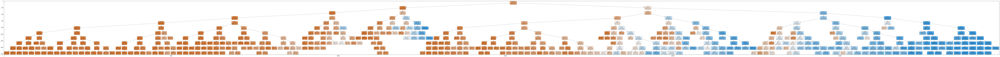

In [242]:
#Decision tree visualization with train dataset
#thumbnail version
import matplotlib.image as mpimg

dot_data = StringIO()

export_graphviz(dtree, out_file= dot_data,
                class_names = X_train_n.columns,   
                filled=True, rounded=True,
                special_characters=True)

filename = "tree.png"
pydotplus.graph_from_dot_data(dot_data.getvalue()).write_png(filename)

plt.figure(figsize=(500,10))

img = mpimg.imread(filename)
imgplot = plt.imshow(img)

plt.show()

#max depth below = 10

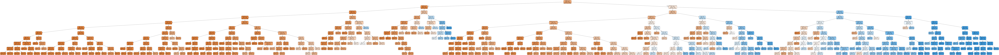

In [243]:
# Feature = column names -> if column =< 0.5, split to the left and if column > 0.5, split to the right

#if feature is true, go to the left. if not, go to the right

# sample -> contains how many samples. samples = 1197 means that the node contains 1197 samples or trained on 1197 samples
#44.75% of the total samples go to the left and 55.25% of the samples go to the right
#Gini Impurity is a measurement of the likelihood of an incorrect classification of a new instance of a random variable.
#Gini 0.213 =  21.3% chance of a new data point being incorrectly classified
# The value line in each box is telling you how many samples at that node fall into each category
dot_data = StringIO()

export_graphviz(dtree, out_file= dot_data,
                feature_names = X_train_n.columns,   
                filled=True, rounded=True,
                special_characters=True)

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  

Image(graph.create_png())

#marital_n =< 1.5

### Evaluate Decision Performance

**ACCURACY SCORE**

In [244]:
#Print accuracy score for test 
from sklearn.metrics import accuracy_score
print(accuracy_score(Y_test, y_pred))

0.8512990602542841


**CONFUSION MATRIX**
- True Positive: You predicted positive and it’s true.
- True Negative: You predicted negative and it’s true.
- False Positive: You predicted positive and it’s false. (Type 1 Error)
- False Negative: You predicted negative and it’s false. (Type 2 Error)


**Machine learning method:**
from sklearn.metrics import confusion_matrix

confusion_matrix(Y_test, y_pred)

However, the above method returns an array. Hence, returned value is harder to manipulate

In [245]:
#confusion_matrix with dataframe
confusion_matrix = pd.crosstab(Y_test, y_pred, rownames=['Actual'], colnames=['Predicted'])
confusion_matrix
#TP = 2195
#TN = 11665
#FP = 770
#FN = 1651

Predicted,0,1
Actual,,
0,11665,770
1,1651,2195


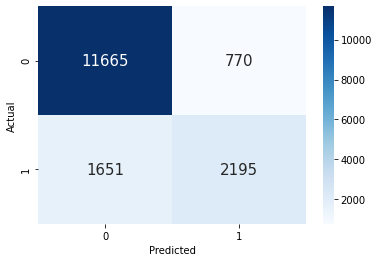

In [246]:
#fmt = d -> interger
#annot (annotation)-> to show value
#annot_kws to show font size
#cmap -> to change the color
import pandas as pd
import seaborn as sn
import matplotlib.pyplot as plt
sn.heatmap(confusion_matrix, annot=True, cmap="Blues", fmt= "d", annot_kws={"size": 15})
plt.show()

In [247]:
#build a function to calculate accuracy score based on confusion matrix
#NOTE: educational purposes only
#(TP+TN)/(TP+TN+FP+FN)

def accuracy_score(score):
  total = score.sum().sum()
  diag = np.diagonal(score).sum()
  return (diag/total)

accuracy_score(confusion_matrix)

0.8512990602542841

**PRECISION**
- More favorable than high recall
- When it predicts yes, how often is it correct?
- Machine learning: from sklearn.metrics import precision_score
- Also known as positive predictive value
- How many positive decision rate you make and how many are correct?
- Precision = TP/(TP+FP)

In [248]:
from sklearn.metrics import precision_score
precision = precision_score(Y_test, y_pred)
precision

0.7403035413153457

**RECALL**
- Less favorable than high precision
- Also known as True Positive Rate or Sensitivity
- When it's actually yes, how often does it predict yes? 
- Machine learning: from sklearn.metrics import recall_score
- Recall = TP/(TP + FN) 

In [249]:
from sklearn.metrics import recall_score
recall = recall_score(Y_test, y_pred)
recall

0.5707228289131565

**FALSE POSITIVE RATE**
- When it's actually no, how often does it predict yes?
- Can also be calculated as 1 - Specifity (True Negative Ratee)

In [250]:
#True positive rate = Recall = Sensitivity = true positive / (true positive + false negative)
#False positive rate = 1 – specificity = false positive / (false positive + true negative)

FPR = (770/(770+11665))
FPR

0.06192199437072778

**F SCORE**
- a measure of a test's accuracy.
- a weighted average of the true positive rate (recall) and precision
- If the precision is equal to 100% and the recall is equal to 0% then the harmonic mean is equal to 0%.
- F1 score also refers to 'harmonic mean'

In [251]:
#F Score: This is a weighted average of the true positive rate (recall) and precision

F_score = 2 * ((precision * recall)/(precision + recall))
F_score

0.6445455880193804

**Area Under The Curve (AUC)**
- makes it easy to compare one ROC curve to another.

**The Receiver Operator Characteristic (ROC)**
- A ROC graph provides an elegant way of presenting multiple confusion matrices produced at different thresholds. 
- A ROC plots the relationship between the true positive rate (y-axis) and the false positive rate (x-axis).
- summarizes the performance of a classifier over all possible thresholds


In [252]:
from sklearn.metrics import roc_curve
from sklearn.metrics import auc

In [253]:
#AUC VALUE

malignant_probs = y_pred

FPR, recall, thresholds = roc_curve(Y_test, malignant_probs)

roc_auc = auc(FPR, recall)
print(roc_auc)

0.7544004172712144


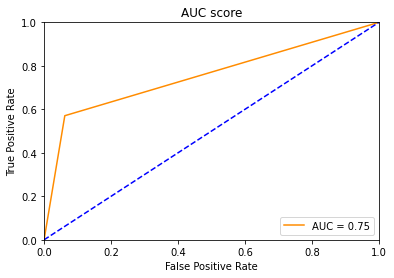

In [254]:
#ROC
#AUC = %number" -> to show how many number behind the decimal value
#'b' -> refer to collor

plt.title('AUC score')
plt.plot(FPR, recall, color= 'darkorange', label = 'AUC = %0.2f' % roc_auc)
plt.legend(loc = 'lower right')
#creating dot blue line to show AUC at 50% or 0.5
#AUC 0.5 = worst prediction
plt.plot([0, 1], [0, 1],'b--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

#the graph below shows that the AUC score is closer to true positive rate than false positive rate. Hence, it shows that the data is more reliable

# Tune Decision Performance

### Try varying FOUR of the hyperparameters manually, as per the following table, and train / score your model for each set of these hyperparameters.

####Four Hyperparameters to vary:
- Split Criteria – ‘Entropy’ or ‘Gini Impurity’
  - The gini impurity measures the frequency at which any element of the dataset will be mislabelled when it is randomly labeled.
  - Entropy is a measure of information that indicates the disorder of the features with the target.
- Minimum Sample Split – The minimum number of samples required to split an internal node. Internal node = a node that can split further
    - **min_samples_split** : int or float, default=2
    The minimum number of samples required to split an internal node:
        - If int, then consider `min_samples_split` as the minimum number.
        - If float, then `min_samples_split` is a fraction and
  `ceil(min_samples_split * n_samples)` are the minimum
  number of samples for each split.
- Minimum Sample Leaf – The minimum number of samples required to be at a leaf node.Leaf Node = a pure node where it can no longer split
    - **min_samples_leaf** : int or float, default=1
        - The minimum number of samples required to be at a leaf node.
        - A split point at any depth will only be considered if it leaves at
    least min_samples_leaf training samples in each of the left and
    right branches.  This may have the effect of smoothing the model,
    especially in regression.
        - If int, then consider `min_samples_leaf` as the minimum number.
        - If float, then `min_samples_leaf` is a fraction and
  `ceil(min_samples_leaf * n_samples)` are the minimum
  number of samples for each node.
- Maximum Depth – Maximum depth of the tree allowed
  - **max_depth** : int, default=None
       - The maximum depth of the tree. 
       - If None, then nodes are expanded until all leaves are pure or until all leaves contain less than min_samples_split samples.

####Check the following model performance:
- Accuracy
- Recall 
- Precision
- F1 Score

In [255]:
from sklearn.metrics import accuracy_score
from sklearn.metrics import recall_score
from sklearn.metrics import precision_score
from sklearn.metrics import f1_score

## Split Criteria: Entropy

**DecisionTreeClassifier()**

def __init__(criterion='gini', splitter='best', max_depth=None, min_samples_split=2, min_samples_leaf=1, min_weight_fraction_leaf=0.0, max_features=None, random_state=None, max_leaf_nodes=None, min_impurity_decrease=0.0, min_impurity_split=None, class_weight=None, presort='deprecated', ccp_alpha=0.0)



### Entropy 1

In [256]:
#Entropy trial 1: max depth = 8, min_samples_split = 10, min_sample_leaf = 20
dtree_en1 = DecisionTreeClassifier(criterion = 'entropy', max_depth=8, min_samples_split= 6, min_samples_leaf=20, random_state=101, max_features= None)
dtree_en1.fit(X_test_n, Y_test)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='entropy',
                       max_depth=8, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=20, min_samples_split=6,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=101, splitter='best')

In [257]:
y_pred_en1 = dtree_en1.predict(X_test_n)
print(y_pred_en1)

[0 0 0 ... 1 1 1]


In [258]:
#confusion matrix for entropy 1
cf_en1 = pd.crosstab(Y_test, y_pred_en1, rownames=['Actual'], colnames=['Predicted'])
cf_en1

Predicted,0,1
Actual,,
0,11683,752
1,1708,2138


In [259]:
#Accuracy
accuracy_score(Y_test, y_pred_en1)

0.8489036299981574

In [260]:
#Recall
recall_score(Y_test, y_pred_en1)

0.5559022360894436

In [261]:
#Precision
precision_score(Y_test, y_pred_en1)

0.7397923875432526

In [262]:
#F1 Score
f1_score(Y_test, y_pred_en1)

0.6347980997624703

### Entropy 2

In [263]:
#Entropy trial 1: max depth = 3, min_samples_split = 6, min_sample_leaf = 20
dtree_en2 = DecisionTreeClassifier(criterion = 'entropy', max_depth=3, min_samples_split= 6, min_samples_leaf=20, random_state=101, max_features= None)
dtree_en2.fit(X_test_n, Y_test)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='entropy',
                       max_depth=3, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=20, min_samples_split=6,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=101, splitter='best')

In [264]:
y_pred_en2 = dtree_en2.predict(X_test_n)
print(y_pred_en2)

[0 0 0 ... 1 1 1]


In [265]:
#confusion matrix for entropy 2
cf_en2 = pd.crosstab(Y_test, y_pred_en2, rownames=['Actual'], colnames=['Predicted'])
cf_en2

Predicted,0,1
Actual,,
0,11456,979
1,1743,2103


In [266]:
#Accuracy
accuracy_score(Y_test, y_pred_en2)

0.8328112523800749

In [267]:
#Recall
recall_score(Y_test, y_pred_en2)

0.546801872074883

In [268]:
#Precision
precision_score(Y_test, y_pred_en2)

0.68234912394549

In [269]:
#F1 Score
f1_score(Y_test, y_pred_en2)

0.6071016166281755

### Entropy 3

In [270]:
#Entropy trial 1: max depth = 8, min_samples_split = 6, min_sample_leaf = 30
dtree_en3 = DecisionTreeClassifier(criterion = 'entropy', max_depth=8, min_samples_split= 6, min_samples_leaf=30, random_state=101, max_features= None)
dtree_en3.fit(X_test_n, Y_test)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='entropy',
                       max_depth=8, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=30, min_samples_split=6,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=101, splitter='best')

In [271]:
y_pred_en3 = dtree_en3.predict(X_test_n)
print(y_pred_en3)

[0 0 0 ... 1 1 1]


In [272]:
#confusion matrix for entropy 3
cf_en3 = pd.crosstab(Y_test, y_pred_en3, rownames=['Actual'], colnames=['Predicted'])
cf_en3

Predicted,0,1
Actual,,
0,11653,782
1,1697,2149


In [273]:
#Accuracy
accuracy_score(Y_test, y_pred_en3)

0.8477366255144033

In [274]:
#Recall
recall_score(Y_test, y_pred_en3)

0.5587623504940198

In [275]:
#Precision
precision_score(Y_test, y_pred_en3)

0.7331968611395429

In [276]:
#F1 Score
f1_score(Y_test, y_pred_en3)

0.6342039250405785

### Entropy 4

In [277]:
#Entropy trial 1: max depth = 8, min_samples_split = 20, min_sample_leaf = 15
dtree_en4 = DecisionTreeClassifier(criterion = 'entropy', max_depth=8, min_samples_split= 20, min_samples_leaf=20, random_state=101, max_features= None)
dtree_en4.fit(X_test_n, Y_test)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='entropy',
                       max_depth=8, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=20, min_samples_split=20,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=101, splitter='best')

In [278]:
y_pred_en4 = dtree_en4.predict(X_test_n)
print(y_pred_en4)

[0 0 0 ... 1 1 1]


In [279]:
#confusion matrix for entropy 4
cf_en4 = pd.crosstab(Y_test, y_pred_en4, rownames=['Actual'], colnames=['Predicted'])
cf_en4

Predicted,0,1
Actual,,
0,11683,752
1,1708,2138


In [280]:
#Accuracy
accuracy_score(Y_test, y_pred_en4)

0.8489036299981574

In [281]:
#Recall
recall_score(Y_test, y_pred_en4)

0.5559022360894436

In [282]:
#Precision
precision_score(Y_test, y_pred_en4)

0.7397923875432526

In [283]:
#F1 Score
f1_score(Y_test, y_pred_en4)

0.6347980997624703

## Split Criteria: Gini Impurity

**DecisionTreeClassifier()**

def __init__(criterion='gini', splitter='best', max_depth=None, min_samples_split=2, min_samples_leaf=1, min_weight_fraction_leaf=0.0, max_features=None, random_state=None, max_leaf_nodes=None, min_impurity_decrease=0.0, min_impurity_split=None, class_weight=None, presort='deprecated', ccp_alpha=0.0)

### Gini 1

In [284]:
#Entropy trial 1: max depth = 8, min_samples_split = 10, min_sample_leaf = 20
dtree_g1 = DecisionTreeClassifier(criterion = 'gini', max_depth=8, min_samples_split= 6, min_samples_leaf=20, random_state=101, max_features= None)
dtree_g1.fit(X_test_n, Y_test)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=8, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=20, min_samples_split=6,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=101, splitter='best')

In [285]:
y_pred_g1 = dtree_g1.predict(X_test_n)
print(y_pred_g1)

[0 0 0 ... 1 1 1]


In [286]:
#confusion matrix for gini 1
cf_g1 = pd.crosstab(Y_test, y_pred_en1, rownames=['Actual'], colnames=['Predicted'])
cf_g1

Predicted,0,1
Actual,,
0,11683,752
1,1708,2138


In [287]:
#Accuracy
accuracy_score(Y_test, y_pred_g1)

0.8489036299981574

In [288]:
#Recall
recall_score(Y_test, y_pred_g1)

0.5652626105044202

In [289]:
#Precision
precision_score(Y_test, y_pred_g1)

0.7339635381498987

In [290]:
#F1 Score
f1_score(Y_test, y_pred_g1)

0.6386603995299647

### Gini 2

In [291]:
#Entropy trial 1: max depth = 3, min_samples_split = 6, min_sample_leaf = 15
dtree_g2 = DecisionTreeClassifier(criterion = 'gini', max_depth=3, min_samples_split= 6, min_samples_leaf=20, random_state=101, max_features= None)
dtree_g2.fit(X_test_n, Y_test)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=3, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=20, min_samples_split=6,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=101, splitter='best')

In [292]:
y_pred_g2 = dtree_g2.predict(X_test_n)
print(y_pred_g2)

[0 0 0 ... 1 1 1]


In [293]:
#confusion matrix for gini 2
cf_g2 = pd.crosstab(Y_test, y_pred_g2, rownames=['Actual'], colnames=['Predicted'])
cf_g2

Predicted,0,1
Actual,,
0,11456,979
1,1743,2103


In [294]:
#Accuracy
accuracy_score(Y_test, y_pred_g2)

0.8328112523800749

In [295]:
#Recall
recall_score(Y_test, y_pred_g2)

0.546801872074883

In [296]:
#Precision
precision_score(Y_test, y_pred_g2)

0.68234912394549

In [297]:
#F1 Score
f1_score(Y_test, y_pred_g2)

0.6071016166281755

### Gini 3

In [298]:
#Entropy trial 1: max depth = 8, min_samples_split = 6, min_sample_leaf = 30
dtree_g3 = DecisionTreeClassifier(criterion = 'gini', max_depth=8, min_samples_split= 6, min_samples_leaf=30, random_state=101, max_features= None)
dtree_g3.fit(X_test_n, Y_test)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=8, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=30, min_samples_split=6,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=101, splitter='best')

In [299]:
y_pred_g3 = dtree_g3.predict(X_test_n)
print(y_pred_g3)

[0 0 0 ... 1 1 1]


In [300]:
#confusion matrix for gini 3
cf_g3 = pd.crosstab(Y_test, y_pred_g3, rownames=['Actual'], colnames=['Predicted'])
cf_g3

Predicted,0,1
Actual,,
0,11534,901
1,1581,2265


In [301]:
#Accuracy
accuracy_score(Y_test, y_pred_g3)

0.8475523616485474

In [302]:
#Recall
recall_score(Y_test, y_pred_g3)

0.5889235569422777

In [303]:
#Precision
precision_score(Y_test, y_pred_g3)

0.715413771320278

In [304]:
#F1 Score
f1_score(Y_test, y_pred_en3)

0.6342039250405785

### Gini 4

In [305]:
#Entropy trial 1: max depth = 8, min_samples_split = 20, min_sample_leaf = 20
dtree_g4 = DecisionTreeClassifier(criterion = 'gini', max_depth=8, min_samples_split= 20, min_samples_leaf=20, random_state=101, max_features= None)
dtree_g4.fit(X_test_n, Y_test)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=8, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=20, min_samples_split=20,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=101, splitter='best')

In [306]:
y_pred_g4 = dtree_g4.predict(X_test_n)
print(y_pred_g4)

[0 0 0 ... 1 1 1]


In [307]:
#confusion matrix for entropy 4
cf_en4 = pd.crosstab(Y_test, y_pred_en4, rownames=['Actual'], colnames=['Predicted'])
cf_en4

Predicted,0,1
Actual,,
0,11683,752
1,1708,2138


In [308]:
#Accuracy
accuracy_score(Y_test, y_pred_g4)

0.8489036299981574

In [309]:
#Recall
recall_score(Y_test, y_pred_g4)

0.5652626105044202

In [310]:
#Precision
precision_score(Y_test, y_pred_g4)

0.7339635381498987

In [311]:
#F1 Score
f1_score(Y_test, y_pred_g4)

0.6386603995299647

## Visualize the Best Tree

Entropy 1 has the best accuracy score

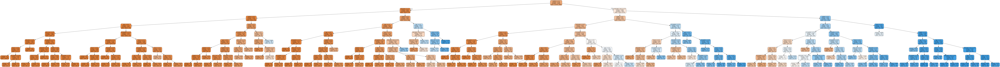

In [312]:
dot_data = StringIO()

export_graphviz(dtree_en1, out_file= dot_data,
                feature_names = X_test_n.columns,   
                filled=True, rounded=True,
                special_characters=True)

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  

Image(graph.create_png())

# Automation of Performance Tuning

In [313]:
#Read the files as data frame
hyper = pd.read_csv('/content/drive/MyDrive/MSBA_Colab_2020/ML_Algorithms/CA03/Hyperparameter.csv')
hyper

,Split Criteria (Entropy or Gini),Minimum Sample Split,Minimum Sample Leaf,Maximum Depth,Accuracy,Recall,Precision,F1 Score
0,Entropy,6,20,8,NaN,NaN,NaN,NaN
1,Entropy,6,20,3,NaN,NaN,NaN,NaN
2,Entropy,6,30,8,NaN,NaN,NaN,NaN
3,Entropy,20,20,8,NaN,NaN,NaN,NaN
4,Gini Impurity,6,20,8,NaN,NaN,NaN,NaN
5,Gini Impurity,6,20,3,NaN,NaN,NaN,NaN
6,Gini Impurity,6,30,8,NaN,NaN,NaN,NaN
7,Gini Impurity,20,20,8,NaN,NaN,NaN,NaN


**DecisionTreeClassifier()**

def __init__(criterion='gini', splitter='best', max_depth=None, min_samples_split=2, min_samples_leaf=1, min_weight_fraction_leaf=0.0, max_features=None, random_state=None, max_leaf_nodes=None, min_impurity_decrease=0.0, min_impurity_split=None, class_weight=None, presort='deprecated', ccp_alpha=0.0)



In [314]:
def model():
  for index, row in hyper.iterrows():
#iterrow is to read every row
    if row["Split Criteria (Entropy or Gini)"] == "Entropy":
      ABC = DecisionTreeClassifier(criterion = 'entropy', random_state=101, max_features= None, min_samples_split=row["Minimum Sample Split"], min_samples_leaf = row["Minimum Sample Leaf"], max_depth = row["Maximum Depth"])
      ABC.fit(X_test_n, Y_test)
      y_pred2 = ABC.predict(X_test_n)
      accuracy = accuracy_score(Y_test, y_pred2)
      recall = recall_score(Y_test, y_pred2)
      precision = precision_score(Y_test, y_pred2)
      f1 = f1_score(Y_test, y_pred2)
      hyper.at[index, 'Accuracy'] = accuracy
      hyper.at[index, 'Recall'] = recall
      hyper.at[index, 'Precision'] = precision
      hyper.at[index, 'F1 Score'] = f1
#the next criterion is gini impurity. If not entropy, must read gini impurity
    elif row["Split Criteria (Entropy or Gini)"] == "Gini Impurity":
      ABC = DecisionTreeClassifier(criterion = 'gini', random_state=101, max_features= None, min_samples_split=row["Minimum Sample Split"], min_samples_leaf = row["Minimum Sample Leaf"], max_depth = row["Maximum Depth"])
      ABC.fit(X_test_n, Y_test)
      y_pred2 = ABC.predict(X_test_n)
      accuracy = accuracy_score(Y_test, y_pred2)
      recall = recall_score(Y_test, y_pred2)
      precision = precision_score(Y_test, y_pred2)
      f1 = f1_score(Y_test, y_pred2)
      hyper.at[index, 'Accuracy'] = accuracy
      hyper.at[index, 'Recall'] = recall
      hyper.at[index, 'Precision'] = precision
      hyper.at[index, 'F1 Score'] = f1
      #pd.DataFrame([accuracy, recall, precision, f1], columns = ['accuracy', 'recall', 'precision', 'f1'])

#need to call on the model before showing the results
model()
hyper.head(8)


,Split Criteria (Entropy or Gini),Minimum Sample Split,Minimum Sample Leaf,Maximum Depth,Accuracy,Recall,Precision,F1 Score
0,Entropy,6,20,8,0.848904,0.555902,0.739792,0.634798
1,Entropy,6,20,3,0.832811,0.546802,0.682349,0.607102
2,Entropy,6,30,8,0.847737,0.558762,0.733197,0.634204
3,Entropy,20,20,8,0.848904,0.555902,0.739792,0.634798
4,Gini Impurity,6,20,8,0.848904,0.565263,0.733964,0.638660
5,Gini Impurity,6,20,3,0.832811,0.546802,0.682349,0.607102
6,Gini Impurity,6,30,8,0.847552,0.588924,0.715414,0.646035
7,Gini Impurity,20,20,8,0.848904,0.565263,0.733964,0.638660


# Prediction using your “trained” Decision Tree Model

Make prediction of a “new” individual’s Income Category (
<=50K, or >50K ) with the following information

- Hours Worked per Week = 48
- Occupation Category = Mid - Low
- Marriage Status & Relationships = High
- Capital Gain = Yes
- Race-Sex Group = Mid
- Number of Years of Education = 12
- Education Category = High
- Work Class = Income
- Age = 58

In [315]:
X_test.head(10)

,hours_per_week,occupation,marital_status,capital_gain_loss,race_sex,education_num,education,workclass,age,flag,hours_n,occupation_n,marital_n,capital_n,race_sex_n,education_num_n,education_n,workclass_n,age_n
0,b. 31-40,b. Mid - Low,a. Low,a. = 0,b. Mid,a. 0-8,a. Low,b. income,a. 0-25,test,1,1,0,0,1,0,0,1,0
1,d. 41-50 & 61-70,b. Mid - Low,c. High,a. = 0,c. High,b. 9-12,b. Mid,b. income,d. 36-40 & 56-60,test,3,1,2,0,2,1,1,1,3
2,b. 31-40,d. Mid - High,c. High,a. = 0,c. High,b. 9-12,b. Mid,b. income,b. 26-30 & 71-100,test,1,3,2,0,2,1,1,1,1
3,b. 31-40,b. Mid - Low,c. High,c. > 0,b. Mid,b. 9-12,b. Mid,b. income,e. 40-55,test,1,1,2,2,1,1,1,1,4
4,a. 0-30,b. Mid - Low,a. Low,a. = 0,b. Mid,b. 9-12,b. Mid,a. no income,a. 0-25,test,0,1,0,0,1,1,1,0,0
5,a. 0-30,a. Low,b. Mid,a. = 0,c. High,a. 0-8,a. Low,b. income,c. 31-35 & 61-70,test,0,0,1,0,2,0,0,1,2
6,b. 31-40,b. Mid - Low,a. Low,a. = 0,b. Mid,b. 9-12,b. Mid,a. no income,b. 26-30 & 71-100,test,1,1,0,0,1,1,1,0,1
7,b. 31-40,e. High,c. High,c. > 0,c. High,e. 15+,e. High,b. income,c. 31-35 & 61-70,test,1,4,2,2,2,4,4,1,2
8,b. 31-40,a. Low,a. Low,a. = 0,b. Mid,b. 9-12,b. Mid,b. income,a. 0-25,test,1,0,0,0,1,1,1,1,0
9,a. 0-30,c. Mid - Mid,c. High,a. = 0,c. High,a. 0-8,a. Low,b. income,e. 40-55,test,0,2,2,0,2,0,0,1,4


The best tree is before the tuning with max_depth = 20, min_samples_leaf = 8 and min_samples_split = 6. Accuracy score is 0.8489
                      

In [316]:
dtree_en1 = DecisionTreeClassifier(criterion = 'entropy', max_depth=8, min_samples_split= 6, min_samples_leaf=20, random_state=101, max_features= None)
dtree_en1.fit(X_test_n, Y_test)
y_pred_en1 = dtree_en1.predict(X_test_n)
print(y_pred_en1)

[0 0 0 ... 1 1 1]


X_train.to_csv('x.csv') -> saving data as csv to google drive

Use unique() to see the unique value as a list so you can easily copy paste the value
- it shows that everything labels with a. = 0, b = 1, c = 2, d = 3, e = 4
- Hence, the list must be arranged from a to e in alphabetical order

In [317]:
sorted(X_test.hours_per_week.unique())

['a. 0-30', 'b. 31-40', 'c. 71-100', 'd. 41-50 & 61-70', 'e. 51-60']

In [318]:
sorted(X_test.occupation.unique())

['a. Low', 'b. Mid - Low', 'c. Mid - Mid', 'd. Mid - High', 'e. High']

In [319]:
sorted(X_test.marital_status.unique())

['a. Low', 'b. Mid', 'c. High']

In [320]:
sorted(X_test.capital_gain_loss.unique())


['a. = 0', 'b. < 0', 'c. > 0']

In [321]:
sorted(X_test.race_sex.unique())

['a. Low', 'b. Mid', 'c. High']

In [322]:
sorted(X_test.education_num.unique())

['a. 0-8', 'b. 9-12', 'c. 13', 'd. 14', 'e. 15+']

In [323]:
sorted(X_test.education.unique())

['a. Low', 'b. Mid', 'c. Bachelors', 'd. Masters', 'e. High']

In [324]:
sorted(X_test.workclass.unique())

['a. no income', 'b. income']

In [325]:
sorted(X_test.age.unique())

['a. 0-25',
 'b. 26-30 & 71-100',
 'c. 31-35 & 61-70',
 'd. 36-40 & 56-60',
 'e. 40-55']

In [326]:
def function(hours, occupation, marriage, capital, race, education_num, education, workclass, age):
  variable = []
#written with (formula) so that the returned value does not have []
  hour = (0 if 0 <= hours <=30 
           else 1 if 31 <= hours <= 40 
           else 2 if 71 <= hours <= 100 
           else 3 if 41 <= hours <= 50 or 61 <= hours <= 70 else 4)

#eliminate all multi-level alphabet
  occup = ['Low', 'Mid - Low' , 'Mid - Mid','Mid - High', 'High']
  occup = occup.index(occupation)

  marital = ['Low', 'Mid', 'High']
  marital = marital.index(marriage)

  capGL = [0, "no", "yes"]
  capGL = capGL.index(capital)

  racesex = ['Low', 'Mid', 'High']
  racesex = racesex.index(race)

#written with (formula) so that the returned value does not have []
  ed_num = (0 if 0 <= education_num <= 8
            else 1 if 9 <= education_num <= 12
            else 2 if education_num == 13
            else 3 if education_num == 14 else 4)

  ed = ['Low', 'Mid', 'Bachelors', 'Masters', 'High']
  ed = ed.index(education)

  wclass = ['no income', 'income']
  wclass = wclass.index(workclass)

#written with (formula) so that the returned value does not have []
  agenum = (0 if 0 <= age <=25 
           else 1 if 26 <= age <= 30 or 71 <= age <=100 
           else 2 if 31 <= age <= 35 or 61 <= age <= 70
           else 3 if 36 <= age <= 40 or 56 <= age <= 60 else 4)
  
  variables = [hour, occup, marital, capGL, racesex, ed_num, ed, wclass, agenum]
  variable.append(variables)
  return list(variable)

#Hours Worked per Week = 48, Occupation Category = Mid - Low, Marriage Status & Relationships = High, Capital Gain = Yes
#Race-Sex Group = Mid, Number of Years of Education = 12, Education Category = High, Work Class = Income, Age = 58


new_person = function(48,'Mid - Low', 'High', 'yes', 'Mid', 12, 'High', 'income', 58)
new_person

[[3, 1, 2, 2, 1, 1, 4, 1, 3]]

In [327]:
dtree_en1.predict(new_person)

array([1])

In [328]:
#to predict the outcome
#the first number is to predict if the outcome is 0 or <50k
#the 2nd number is to predict if the outcome is 1 or >50k
dtree_en1.predict_proba(new_person)

array([[0.28395062, 0.71604938]])

Yes, the income is above 50k

Based on the prediction probability, the chances that the new person will have income above 50k is 71.60%